In [ ]:
 !pip install segment-geospatial

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 3.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 63.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.0/484.0 kB 23.1 MB/s eta 0:00:

In [ ]:
import os
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

In [ ]:
m = leafmap.Map(center=[37.8713, -122.2580], zoom=17, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[37.8713, -122.258], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

In [ ]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [71.4728, 30.1967, 71.5053, 30.2102]

In [ ]:
 m.user_roi_bounds()

[71.4728, 30.1967, 71.5053, 30.2102]

In [ ]:
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=17, source="Satellite", overwrite=True)

Downloaded image 01/91
Downloaded image 02/91
Downloaded image 03/91
Downloaded image 04/91
Downloaded image 05/91
Downloaded image 06/91
Downloaded image 07/91
Downloaded image 08/91
Downloaded image 09/91
Downloaded image 10/91
Downloaded image 11/91
Downloaded image 12/91
Downloaded image 13/91
Downloaded image 14/91
Downloaded image 15/91
Downloaded image 16/91
Downloaded image 17/91
Downloaded image 18/91
Downloaded image 19/91
Downloaded image 20/91
Downloaded image 21/91
Downloaded image 22/91
Downloaded image 23/91
Downloaded image 24/91
Downloaded image 25/91
Downloaded image 26/91
Downloaded image 27/91
Downloaded image 28/91
Downloaded image 29/91
Downloaded image 30/91
Downloaded image 31/91
Downloaded image 32/91
Downloaded image 33/91
Downloaded image 34/91
Downloaded image 35/91
Downloaded image 36/91
Downloaded image 37/91
Downloaded image 38/91
Downloaded image 39/91
Downloaded image 40/91
Downloaded image 41/91
Downloaded image 42/91
Downloaded image 43/91
Downloaded 

In [ ]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=3455676.0, center=[30.20345, 71.48905], controls=(ZoomControl(options=['position', 'zoom_in_text', …

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

In [ ]:
sam.generate(image, output="masks.tif", foreground=True, unique=True)

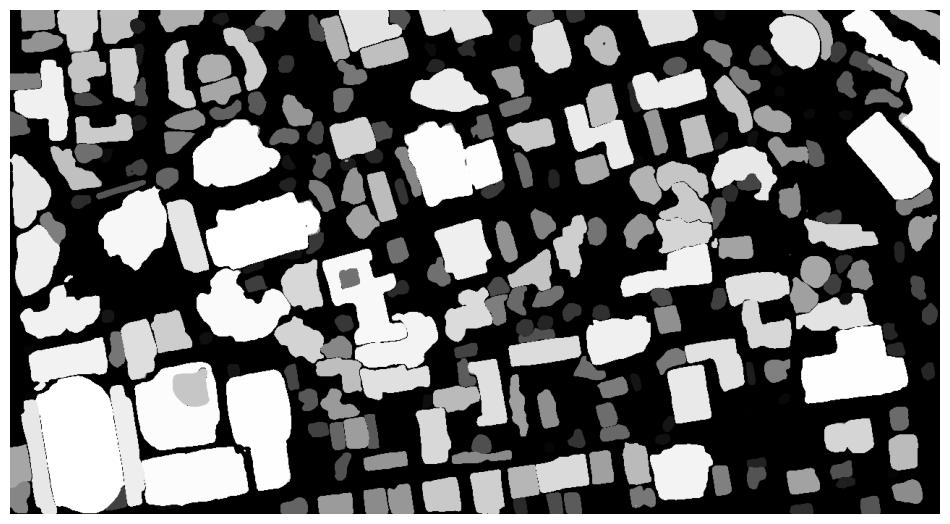

In [ ]:
sam.show_masks(cmap="binary_r")

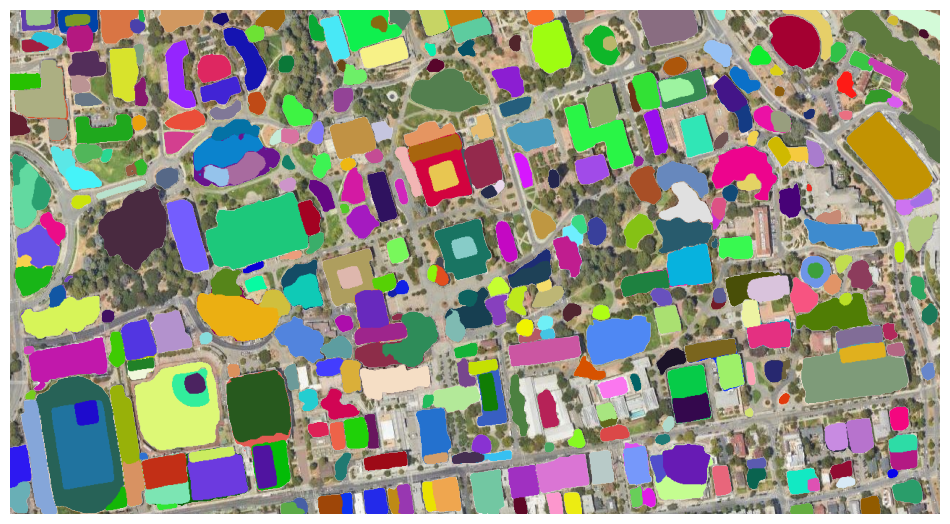

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")

In [ ]:
leafmap.image_comparison(
    "satellite.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

In [ ]:
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=405342.0, center=[37.87115, -122.259], controls=(ZoomControl(options=['position', 'zoom_in_text', '…

In [ ]:
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=101922.0, center=[37.87115, -122.259], controls=(ZoomControl(options=['position', 'zoom_in_text', '…

In [ ]:
sam.tiff_to_vector("masks.tif", "masks.gpkg")

In [ ]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=sam_kwargs,
)

In [ ]:
sam.generate(image, output="masks2.tif", foreground=True)

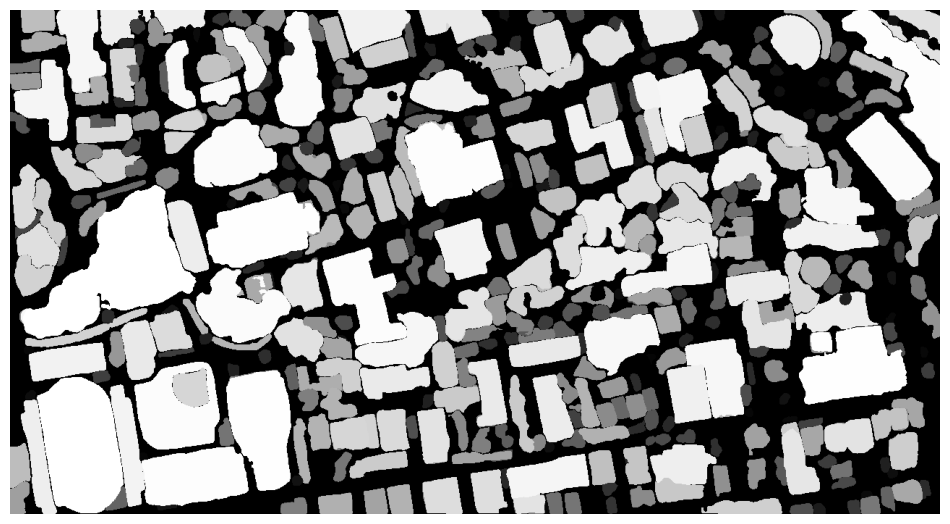

In [ ]:
sam.show_masks(cmap="binary_r")

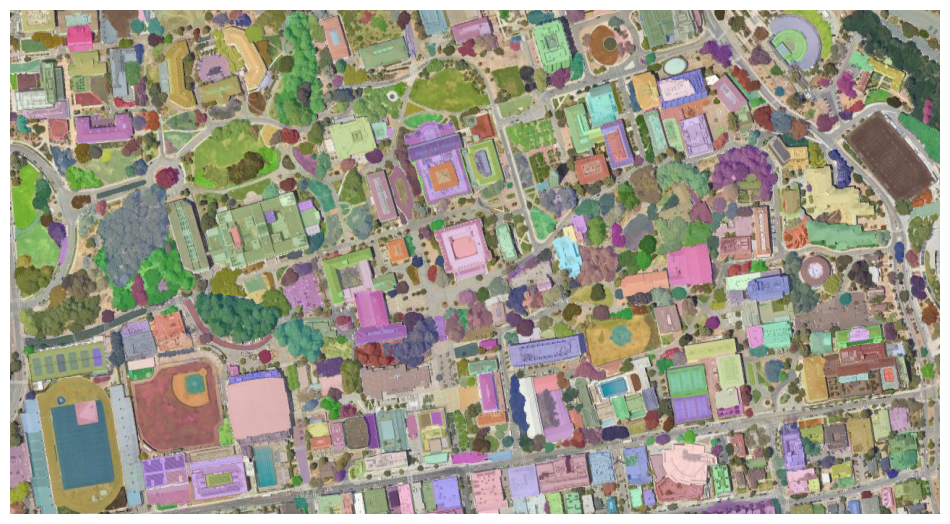

In [ ]:
sam.show_anns(axis="off", opacity=1, output="annotations2.tif")


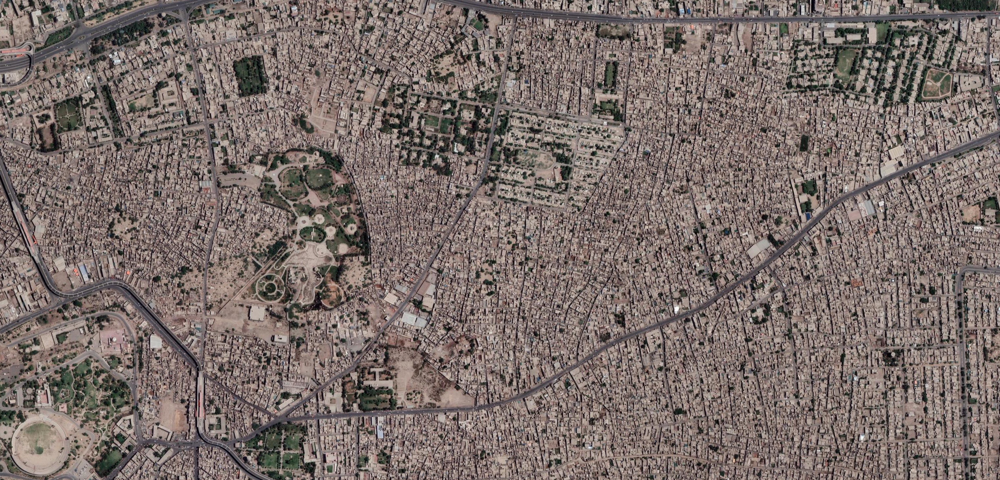
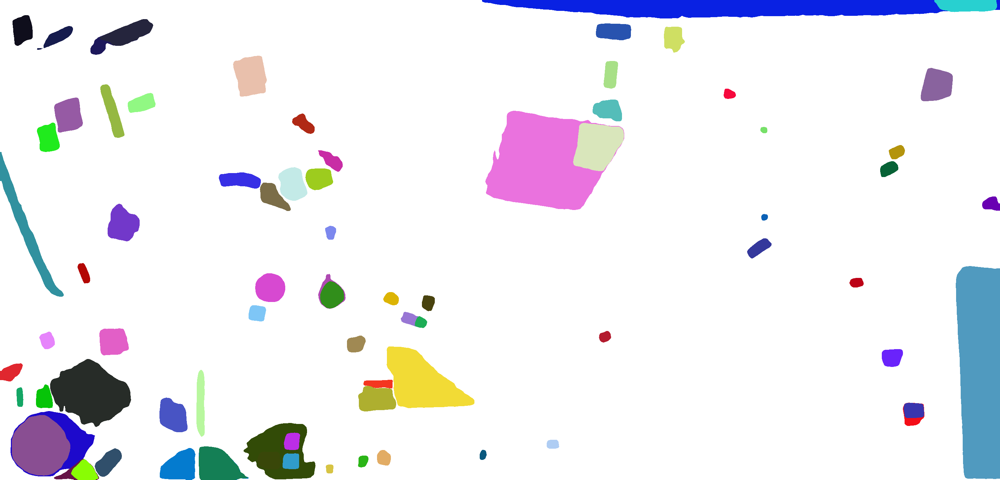

In [ ]:
leafmap.image_comparison(
    image,
    "annotations.tif",
    label1="Image",
    label2="Image Segmentation",
)

In [ ]:
overlay_images(image, "annotations2.tif", backend="TkAgg")

The TkAgg backend is not supported in Google Colab. The overlay_images function will not work on Colab.
